# End-to-End Multi-class Dog Breed Classification

This notebook builds an end-to-end Multi-class image classifier using Tensorflow and Tensorflow Hub

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I take the photo of a dog, I want to know what breed of a dog it is.

## 2. Data

The data we are using is from Kaggle Dog Breed Identification.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probability for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data
* We're dealing with the images (unstructured data) so it's best if we use deep learning/transfer learning.
* There are 120 breeds of dogs (there are 120 different classes).
* There are around 10000+ images in training set. (these images have labels)
* There are around 10000+ images in test set. (these images don't have labels because we'll want to predict them)

In [1]:
# unzip the uploaded data into google drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification (1).zip" -d "drive/MyDrive/Dog Vision/"

### Get our workspace ready

* Import Tensorflow 2.x ✅
* Import Tensorflow Hub ✅
* Make sure we're using a GPU ✅

In [2]:
# import neccessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)

# check for GPU availabilty
print("GPU", "available (YES!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version:  2.15.0
TF Hub version:  0.16.1
GPU available (YES!!!)


## Getting our data (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's our first step. Turning our images into Tensors (numerical representation).

Let's start by accessing our data and checking out the labels.

In [3]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


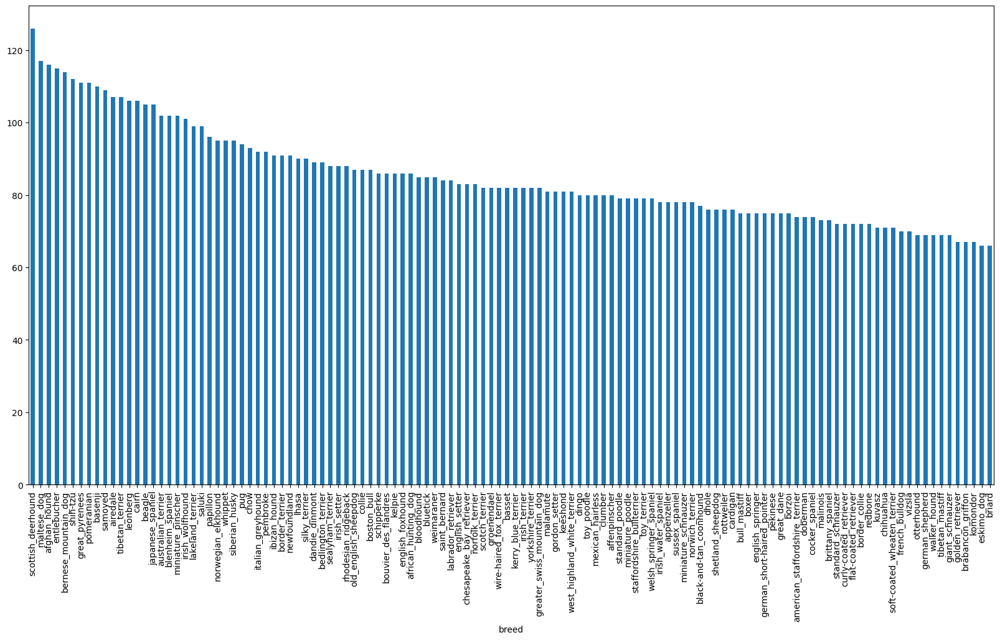

In [5]:
# How many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [6]:
labels_csv["breed"].value_counts().median()

82.0

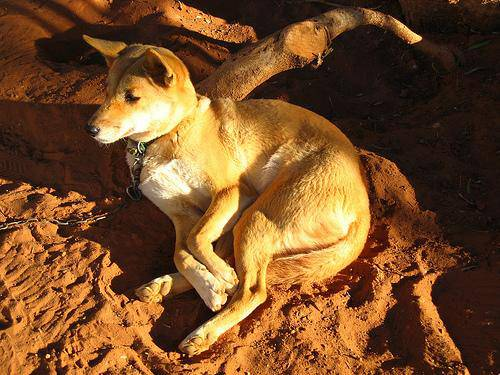

In [7]:
# Let's view an image

from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")


### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fnames + ".jpg" for fnames in labels_csv["id"]]

# check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames matches actual amount of files!!! Proceed!")
else:
  print("Filenames does not matches actual amount of files, check the target directory.")

Filenames matches actual amount of files!!! Proceed!


In [11]:
os.listdir("drive/MyDrive/Dog Vision/train/")[:10]

['e92c996c9454434af5a9e702076338dc.jpg',
 'e229e4628facf3fb9cd030e0ac484722.jpg',
 'e073b458a33cbfe9b733764a1246f52e.jpg',
 'e2bbe6eedea8520efe8c709d091be39a.jpg',
 'dc58e98a94ff4d49ff7242b5b860f167.jpg',
 'e75f2316c5dd47b87a22bbe95cf8b8da.jpg',
 'dc3d4d214533950f6465ec2483af39c0.jpg',
 'e7faa5748d8320f604aeb3fd5bbe4ab0.jpg',
 'e8f5dd1ad67209c064965691030a07e5.jpg',
 'e7518def797fd4193bebc97d52ecd66f.jpg']

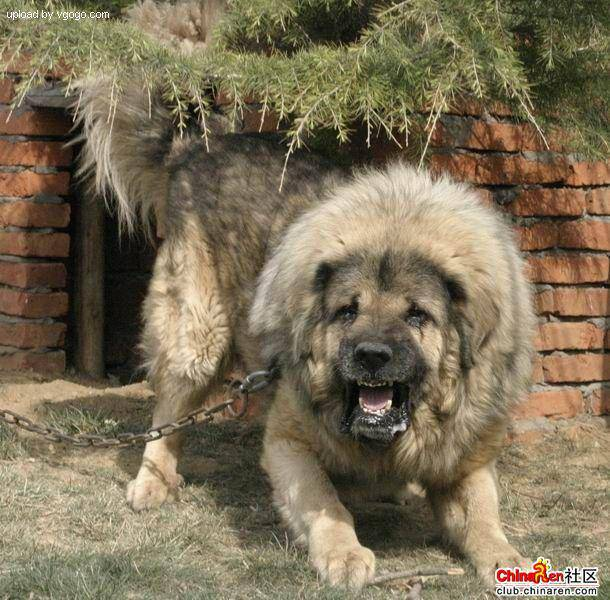

In [12]:
# One more check
Image(filenames[9000])

In [13]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we got our training image filepath in a list, let's prepare our labels.

In [14]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same think as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# see if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not matches number of filenames!, check data directories")

Number of labels matches number of filenames!


In [17]:
# find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [18]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [19]:
# turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
len(boolean_labels)

10222

In [22]:
# example: turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where the label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [23]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [24]:
# setup x and y variables
x = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [25]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [26]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [27]:
# Let's have geez at a training data
x_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (Turning our images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take a image filepath as an input
2. Use Tensorflow to read a file and save it to variable, 'image'.
3. Turn our 'image' (a jpg) into Tensors
4. Resize the 'image' to be a shape of (224, 224)
5. Return the modified 'image'

Before we do, let's see what importing image looks like

In [28]:
# convert image into Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape # 3 is a colour channel

(257, 350, 3)

In [29]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [30]:
# Turn image into Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen how image looks as tensor, let's make a function to preprocess them.

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take a image filepath as an input
2. Use Tensorflow to read a file and save it to variable, 'image'.
3. Turn our 'image' (a jpg) into Tensors
4. Normalize our image (convert colour channel values from 0-255 to 0-1).
5. Resize the 'image' to be a shape of (224, 224)
6. Return the modified 'image'


In [31]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into Tensors.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg images into numerical Tensors with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert colour channel values from 0-255 and 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you are trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is batch size) images at a time (you can manually adjust batch size if needed)

In order to use Tensorflow effectively, we need our data in form of Tensor tuples which looks like this:
(image, label)

In [32]:
# create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and associated label, process the image and returns the tuple (image, label)
  """
  image = process_image(image_path)
  return image, label

In [33]:
## Demo of the above function
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into tuples of Tensors in the form: "(image, label)", let's make a function to turn all our data (x and y) into batches!

In [34]:
# Define the batch size, 32 is good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it is validation data.
  Also accepts test data as inputs (no labels).
  """
  # If the data is test dataset, we definitely don't have labels
  if test_data:
    print("Creating the test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)


  # If the data is valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepath
                                              tf.constant(y))) #label
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)


  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [35]:
# create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [36]:
# checkout the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand, let's visualize them.

In [37]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(image, label):
  """
  Displays a plot of 25 images and their label from a data batch
  """
  # Setup a figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # create a subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # display a image
    plt.imshow(image[i])
    # add the image label as the title
    plt.title(unique_breeds[np.argmax(label[i])])
    # Turn the grid lines off
    plt.axis("off")

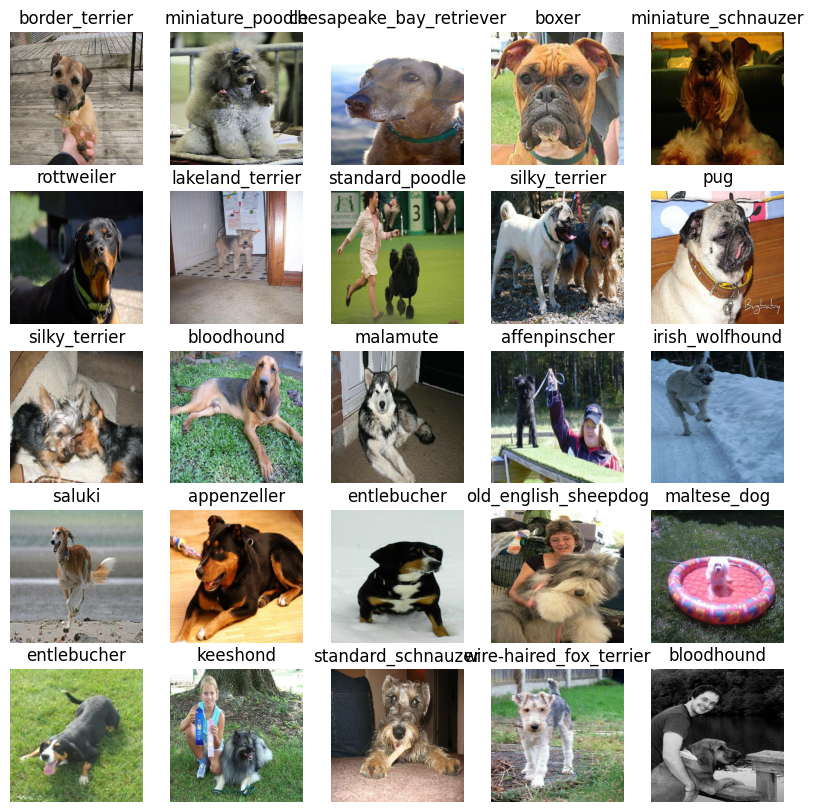

In [38]:
# now let's visualize data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

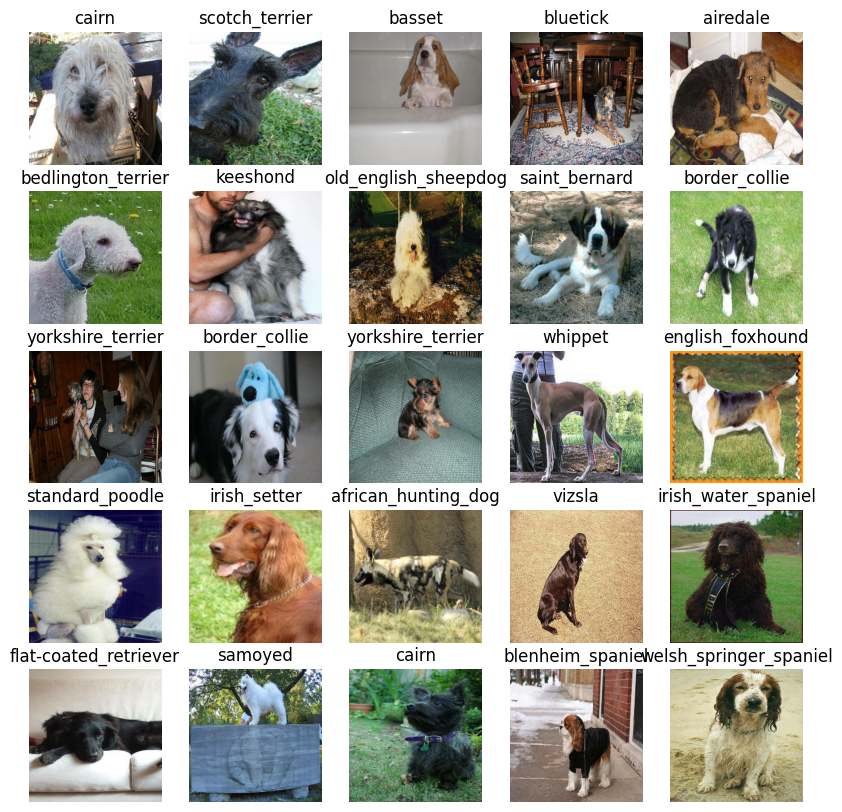

In [39]:
# Now visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are few things we need to define:
* The input shape (the images shape, in the form of tensors) to our model.
* The output shape (the image labels, in the form of tensors) of our model
* The URL of the model we want to use from Kaggle - https://www.kaggle.com/models

In [40]:
# setup the input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, width, height, colour channel

# setup output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# setup model url from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/5"

Now we have got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model.

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we have chosen as parameters.
* Defines a layers in Keras model in sequential fashion (Do this first, then this, then that).
* Complies the model (says it should be evaluated and improved)
* Builds the model (tell the model the input shape it'll be getting)
* Returns the model.

All of the steps can be found here: https://www.tensorflow.org/guide/keras

In [41]:
# create a function which builds Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model



In [42]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


## Creating the callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one is Tensorboard which helps to track the model progress and another for early stopping which prevents our model from training for too long.

### Tensorboard callback

To setup a tensorboard callback, we need to do 3 things:
1. Load the Tensorboard notebook extension.
2. Create a Tensorboard callback which is able to save logs to directory and pass it to our model's fit() function.
3. Visualize our model's training logs with '%tensorboard' magic function (We'll do this after model training).

In [43]:
# load Tensorboard notebook extension
%load_ext tensorboard

In [44]:
import datetime

# create a function to build tensorboard callback.
def create_tensorboard_callback():
  # create a log directory for storing Tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/Logs",
                        # Make it so the logs get tracked whenever we run the experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

It helps to stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [45]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [46]:
NUM_EPOCH = 100 #@param {type:"slider", min:10, max:100, step:10}

In [47]:
# check to make sure we are still running on GPU
print("GPU", "available(Yess!)" if tf.config.list_physical_devices("GPU") else "Not available :(")

GPU available(Yess!)


Let's create a function which trains a model.

* Create a model using 'create_model()'
* Setup a Tensorboard callback using 'create_tensorboard_callback()'
* Call the 'fit()' function on our model passing it the training data, validation data, number of epochs to train for 'NUM_EPOCH' and the callback we'd like to use.
* Return the model

In [48]:
# Build a function to train and return a trained model
def train_model():
  """
  Train a given model and returns the trained version
  """
  # create a model
  model = create_model()

  # create new Tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callback we created
  model.fit(x=train_data,
            epochs=NUM_EPOCH,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [49]:
# Fit the model to the data
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/5
Epoch 1/100
25/25 [==============================] - 216s 9s/step - loss: 4.5325 - accuracy: 0.1150 - val_loss: 3.2469 - val_accuracy: 0.3250
Epoch 2/100
25/25 [==============================] - 4s 169ms/step - loss: 1.5342 - accuracy: 0.6988 - val_loss: 2.0592 - val_accuracy: 0.5350
Epoch 3/100
25/25 [==============================] - 4s 142ms/step - loss: 0.5051 - accuracy: 0.9350 - val_loss: 1.6494 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 5s 192ms/step - loss: 0.2250 - accuracy: 0.9912 - val_loss: 1.4935 - val_accuracy: 0.6550
Epoch 5/100
25/25 [==============================] - 5s 182ms/step - loss: 0.1320 - accuracy: 0.9975 - val_loss: 1.4288 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 4s 161ms/step - loss: 0.0903 - accuracy: 0.9987 - val_loss: 1.3982 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================] 

*Question:* It looks like our model is overfitting because it's performing far better on training set than the validation set. What are the some ways to prevent model overfitting in deep learning neural network?

*Note:* Overfitting to begin with is a good thing! It means our model is learning.





### checking the tensorboard log

The tensorboard magic function ('%tensorboard') will access the logs directory we created earlier and visualize it's contents.

In [50]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/Logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using trained model

In [51]:
# make prediction on validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 110ms/step


array([[6.5618390e-03, 1.8625768e-03, 1.1201965e-04, ..., 2.7849644e-03,
        2.5050589e-04, 4.5233113e-03],
       [9.6055702e-04, 4.3454650e-03, 3.5281598e-03, ..., 9.1396610e-04,
        4.7326516e-02, 2.2395689e-04],
       [1.8473830e-06, 2.0444271e-05, 1.2146566e-04, ..., 2.9971905e-05,
        3.1553788e-04, 4.7005685e-03],
       ...,
       [5.2927520e-05, 1.1161158e-04, 9.3193403e-06, ..., 3.8106562e-05,
        4.1127074e-04, 6.9786016e-05],
       [3.8667738e-05, 6.0532161e-06, 6.0539032e-06, ..., 1.0253779e-05,
        1.6552778e-05, 1.0630597e-03],
       [2.1918424e-04, 4.8407992e-06, 4.6110090e-05, ..., 6.0168901e-03,
        8.0588588e-04, 1.2433444e-04]], dtype=float32)

In [52]:
predictions[0]

array([6.5618390e-03, 1.8625768e-03, 1.1201965e-04, 1.3056706e-04,
       7.1218829e-03, 2.6930484e-04, 5.8648223e-03, 7.3389465e-04,
       1.3687558e-03, 7.6826965e-04, 4.4145336e-04, 8.1010221e-04,
       8.1207079e-04, 5.7677709e-04, 8.7000793e-05, 1.2781760e-03,
       4.5382651e-05, 3.1802658e-02, 1.0603640e-03, 1.7518201e-04,
       6.6275545e-03, 2.5915620e-03, 4.4305646e-04, 6.5185372e-03,
       3.2198186e-05, 6.1953318e-04, 7.6047309e-02, 8.2658553e-05,
       1.6963743e-03, 1.4208019e-03, 7.3747488e-04, 7.3583238e-03,
       3.0136429e-04, 1.6806097e-03, 1.5183304e-04, 1.4780752e-01,
       7.9289421e-05, 8.0679503e-04, 2.7827843e-04, 4.3471367e-04,
       2.4139961e-04, 7.1650132e-04, 8.2062288e-05, 2.7755980e-04,
       1.8368050e-03, 1.4134916e-03, 2.9611925e-04, 2.0315154e-03,
       7.6908042e-04, 2.8885952e-03, 4.7375866e-05, 1.5218001e-04,
       3.2817035e-03, 2.4312244e-04, 3.6966187e-04, 4.2294461e-05,
       1.9357264e-03, 1.6547192e-02, 4.9433025e-04, 5.0768334e

In [53]:
np.sum(predictions[0])

1.0

In [54]:
predictions.shape

(200, 120)

In [55]:
len(y_val)

200

In [56]:
len(unique_breeds)

120

In [57]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.53072396e-04 2.81144839e-05 3.64037769e-05 1.02002596e-04
 2.84538511e-03 1.96392532e-04 9.14030679e-05 8.09546211e-04
 2.53842995e-02 2.89296489e-02 1.55583897e-04 6.65950720e-05
 3.10422969e-04 2.73777568e-03 1.38241879e-03 3.22462362e-03
 5.46366537e-05 2.30097023e-04 2.37290654e-03 2.70665369e-05
 1.77188610e-06 2.57296930e-03 5.51188486e-06 1.47043669e-04
 3.51977115e-03 2.17649613e-05 5.67741608e-06 4.60097726e-05
 2.08681391e-04 3.57355639e-05 1.05701338e-05 9.13768308e-05
 2.02592026e-04 1.55470145e-04 1.18116630e-04 1.80390398e-05
 1.77674927e-04 4.81132593e-04 1.19208664e-04 5.91104090e-01
 1.90000137e-04 2.15225973e-05 8.72959732e-04 2.85900296e-05
 1.24730796e-04 1.29591390e-05 1.68133454e-04 7.63864780e-04
 1.50500709e-04 1.06310996e-04 8.45565155e-05 2.24714968e-05
 4.51053464e-04 2.95590085e-04 4.40036019e-05 3.37296427e-04
 8.61961162e-05 1.25204650e-04 4.30785622e-05 1.29280197e-05
 5.33041057e-05 3.29906790e-04 1.61335458e-06 8.04531082e-05
 2.46170657e-05 1.279232

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probability are also known as confidence levels.

In [58]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[17])
pred_label

'african_hunting_dog'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make prediction on the validation images and then compare those prediction to the validation labels (truth labels)

In [59]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [60]:
# create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes the batched dataset of (image, label) Tensors and returns separate arrays of images and labels
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [61]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make a function to make these all in visualization.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities into predicted labels
* Plot the predicted label, it's predicted probability, the truth label and target image in a single plot.

In [62]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot images and remove tick
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # change the plot title to predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

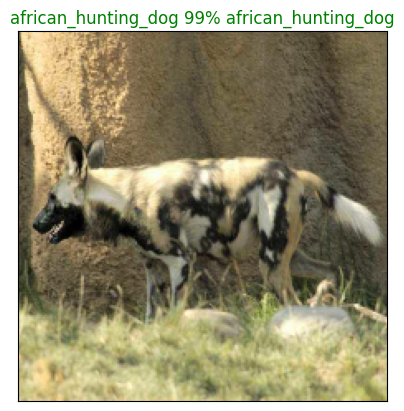

In [63]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=17)

Now we've got one function to visualize our model prediction, let's make another to view our models top 10 prediction:

The function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the predicted label using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probabilities values and labels, colouring the label green.

In [64]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction onfidences along with truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # change the colour of the true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

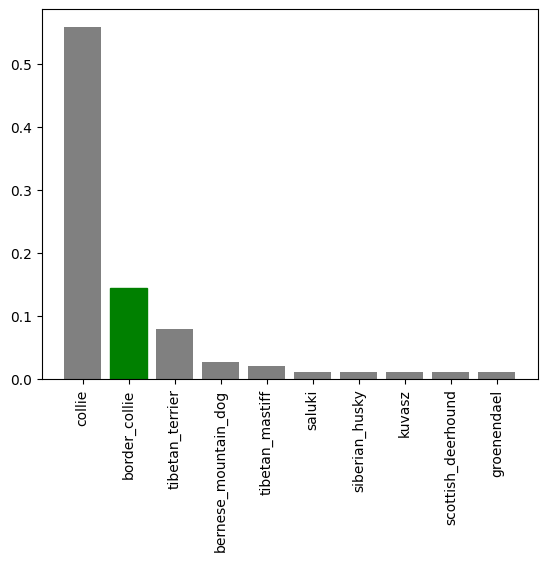

In [65]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our prediction and evaluate our model, let's check out a few.

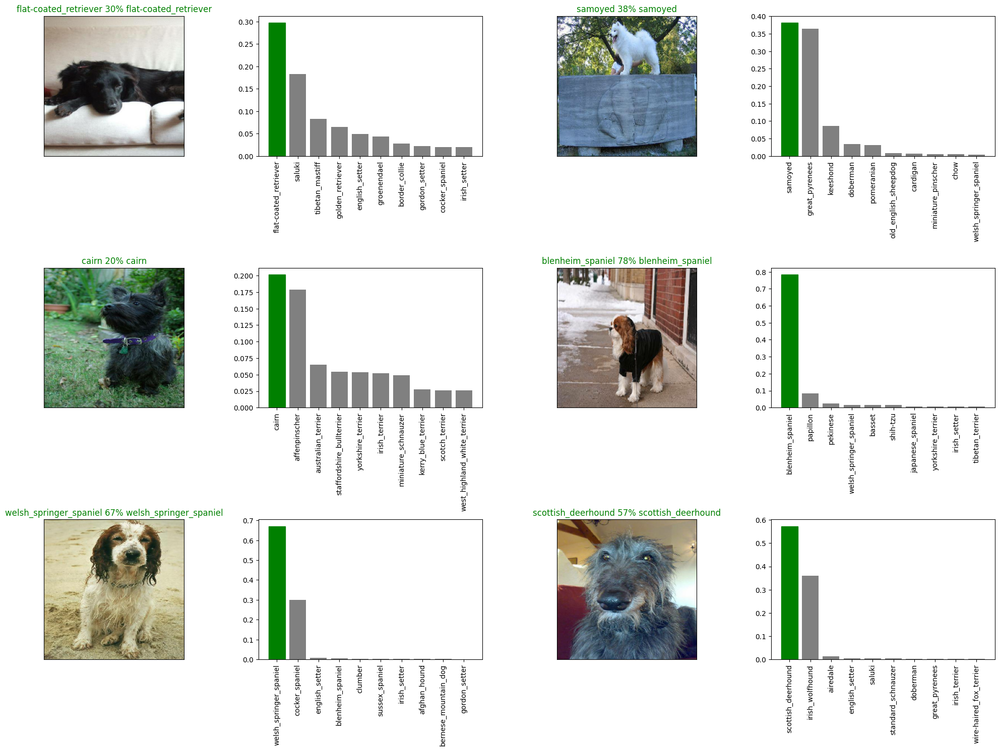

In [66]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_cols * num_rows
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


**Challenge:** How would you create a confusion matrix with our models prediction and true labels?

## Saving and reloading the trained model

In [67]:
# create a function to save a model
def save_model(model, suffix=None):
  """
  saves a model in models directory and appends a suffix (string).
  """
  # create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".keras" # save format for model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [68]:
# create a function to load a trained model
def load_model(model_path):
  """
  Load a saved model from a specified path
  """
  print(f"Loading a saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


Now we've got the functions to save and load a trained model. Let's make sure they work.

In [69]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam-optimizer")

Saving model to: drive/MyDrive/Dog Vision/models/20240518-18221716056539-1000-images-mobilenetv2-Adam-optimizer.keras...


'drive/MyDrive/Dog Vision/models/20240518-18221716056539-1000-images-mobilenetv2-Adam-optimizer.keras'

In [70]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20240514-16461715705192-1000-images-mobilenetv2-Adam-optimizer.keras")

Loading a saved model from: drive/MyDrive/Dog Vision/models/20240514-16461715705192-1000-images-mobilenetv2-Adam-optimizer.keras


In [71]:
# evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 109ms/step - loss: 1.3406 - accuracy: 0.6750


[1.340596318244934, 0.675000011920929]

In [72]:
# evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 102ms/step - loss: 1.3111 - accuracy: 0.6750


[1.3110747337341309, 0.675000011920929]

## Training a model (on a full data)

In [73]:
len(x), len(y)

(10222, 10222)

In [74]:
# create a data batch with full dataset
full_data = create_data_batches(x, y)

Creating training data batches...


In [75]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [76]:
# create a model for full model
full_model =  create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/5


In [77]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe upto 30 mins for first epoch) because GPU we are using in runtime has to load all of images into memory.

In [78]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCH,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 45s 129ms/step - loss: 1.3067 - accuracy: 0.6725
Epoch 2/100
320/320 [==============================] - 42s 130ms/step - loss: 0.3855 - accuracy: 0.8847
Epoch 3/100
320/320 [==============================] - 39s 122ms/step - loss: 0.2184 - accuracy: 0.9413
Epoch 4/100
320/320 [==============================] - 40s 125ms/step - loss: 0.1425 - accuracy: 0.9657
Epoch 5/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0984 - accuracy: 0.9803
Epoch 6/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0694 - accuracy: 0.9890
Epoch 7/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0539 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0406 - accuracy: 0.9956
Epoch 9/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0341 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 43s 135m

In [79]:
save_model(full_model, suffix="full-data-images-mobilenetv2-Adam-optimizer")

Saving model to: drive/MyDrive/Dog Vision/models/20240518-18401716057630-full-data-images-mobilenetv2-Adam-optimizer.keras...


'drive/MyDrive/Dog Vision/models/20240518-18401716057630-full-data-images-mobilenetv2-Adam-optimizer.keras'

In [80]:
# load in the full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20240515-14221715782939-full-data-images-mobilenetv2-Adam-optimizer.keras")

Loading a saved model from: drive/MyDrive/Dog Vision/models/20240515-14221715782939-full-data-images-mobilenetv2-Adam-optimizer.keras


## Making predictions on test data

Since our model has been trained on images in the form of Tensor batches, to make predictions on test data, we have to get it into the same format.

Luckily we created 'create_data_batches()' earlier which can take list of filenames as input and convert them into tensor batches.

To make predictions on test data, we'll:
* Get the test images filename.
* Convert the filenames into test data batches using 'create_data_batches()' and setting the 'test_data' parameter to True (since the test data has no labels)
* Make the prediction array by passing the test batches to 'predict()' method called on our model.

In [81]:
# Load the test filenames
import os
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e1f7ec4bd372612f53411026aaabf233.jpg',
 'drive/MyDrive/Dog Vision/test/e4e57083c3b68e91760ce6f5fcd0a2f9.jpg',
 'drive/MyDrive/Dog Vision/test/e5657f523cf994628f63b673c88e9112.jpg',
 'drive/MyDrive/Dog Vision/test/e05367db91d0449b2afe76a1b7acc1c8.jpg',
 'drive/MyDrive/Dog Vision/test/e2888231cedd08540816e629c0733922.jpg',
 'drive/MyDrive/Dog Vision/test/e648a16d81b6441658b77bca0f1be4ee.jpg',
 'drive/MyDrive/Dog Vision/test/e751e319cfdc9912ae2e5da2a9b053e0.jpg',
 'drive/MyDrive/Dog Vision/test/dcccc266ef919edbf3416078edc849db.jpg',
 'drive/MyDrive/Dog Vision/test/dd8d95720349f85d2a795adaafc71172.jpg',
 'drive/MyDrive/Dog Vision/test/e7a1b7a42db97df750aeae212a02d9c4.jpg']

In [82]:
len(test_filenames)

10357

In [83]:
# create test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating the test data batches...


In [84]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** calling predict() on full data and passing test data will take long time to run.

In [85]:
# make prediction test data using loaded full model
test_prediction = loaded_full_model.predict(test_data,
                                            verbose=1)

324/324 [==============================] - 234s 709ms/step


In [86]:
# save predictions (Numpy array) to csv file (for access later)
# np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_prediction, delimiter=",")

In [87]:
# Load prediction (numpy array) from csv file
import numpy as np
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/dog-vision-prediction-probabilites-array.csv", delimiter=",")
test_predictions[:10]

array([[1.61196489e-09, 3.44086413e-12, 2.32834394e-11, ...,
        1.06917716e-13, 1.58530451e-08, 1.52161670e-06],
       [3.17894322e-10, 3.20088262e-14, 1.85374840e-10, ...,
        7.00588814e-08, 1.88822238e-08, 2.56980937e-10],
       [4.27301083e-09, 1.84139528e-13, 1.11784948e-09, ...,
        2.71949238e-12, 2.23927123e-06, 7.41860809e-11],
       ...,
       [4.47232779e-10, 4.28004029e-07, 4.11986996e-08, ...,
        4.65437893e-07, 8.21722967e-10, 8.86002116e-09],
       [3.50528079e-11, 1.94377336e-03, 1.44941642e-10, ...,
        1.56135718e-06, 6.13228721e-08, 7.32120961e-12],
       [1.23221771e-08, 3.08354520e-09, 1.87174110e-10, ...,
        8.16165635e-10, 9.98905063e-01, 6.73740752e-09]])

In [88]:
test_predictions.shape

(10357, 120)

## Preparing test dataset prediction for kaggle

Looking at a kaggle sample submission, we need a .csv file with ID and each different breed columns.

To get the data in this format, we'll
* Create a pandas DataFrame with ID column as well as column for each dog breed.
* Add data to ID column by extracting test image ID's from their filepaths.
* Add data (prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as csv to submit in Kaggle

In [89]:
# create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [90]:
# Append test image ID's to prediction DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [91]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1f7ec4bd372612f53411026aaabf233,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e4e57083c3b68e91760ce6f5fcd0a2f9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e5657f523cf994628f63b673c88e9112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e05367db91d0449b2afe76a1b7acc1c8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2888231cedd08540816e629c0733922,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [92]:
# Add the prediction probabilities to each dog breed columns
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1f7ec4bd372612f53411026aaabf233,1.611965e-09,3.440864e-12,2.328344e-11,1.407994e-12,5.980330e-09,2.145339e-11,5.328517e-10,1.764934e-10,4.491057e-11,...,8.200658e-09,4.056766e-08,2.202154e-11,3.074556e-12,7.080598e-12,3.024534e-09,2.991727e-07,1.069177e-13,1.585305e-08,1.521617e-06
1,e4e57083c3b68e91760ce6f5fcd0a2f9,3.178943e-10,3.200883e-14,1.853748e-10,1.954662e-13,8.682216e-07,3.362278e-07,2.264711e-06,9.995926e-01,1.876677e-10,...,3.441671e-07,1.129437e-04,6.675200e-09,1.690707e-06,6.804413e-10,5.923428e-09,5.574148e-09,7.005888e-08,1.888222e-08,2.569809e-10
2,e5657f523cf994628f63b673c88e9112,4.273011e-09,1.841395e-13,1.117849e-09,1.106639e-10,7.225005e-11,1.169239e-05,7.223256e-07,5.553372e-04,9.785655e-11,...,3.530463e-09,4.605002e-05,9.586189e-12,2.740325e-08,8.798643e-12,2.793681e-08,1.502214e-07,2.719492e-12,2.239271e-06,7.418608e-11
3,e05367db91d0449b2afe76a1b7acc1c8,5.227723e-14,3.371553e-14,1.638175e-11,5.283554e-12,7.160043e-08,1.832600e-13,6.625124e-13,1.087913e-13,8.482403e-11,...,5.968796e-12,1.492889e-13,2.230498e-06,4.158368e-10,9.999646e-01,3.224581e-13,1.426521e-11,2.974644e-12,8.130380e-13,6.134530e-11
4,e2888231cedd08540816e629c0733922,9.613753e-11,1.304277e-08,1.246931e-08,1.478856e-07,6.658420e-09,6.374474e-12,2.422878e-05,4.128350e-09,1.767556e-04,...,1.207746e-06,2.052871e-08,6.508744e-13,2.080402e-10,1.428936e-09,5.703394e-08,1.541623e-06,2.052792e-05,3.110282e-04,1.318874e-06


In [93]:
# Save the prediction as csv
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_1_submission.csv",
                index=False)

## Making prediction on custom images

To make a prediction on custom images, we'll
* Get the filepaths of our own images
* Turn the filepath into data batches using 'create_data_batches()'. Since our custom images won't have labels, we will set 'test_data' parameter to 'True'.
* Pass the custom image data batch to our model's 'predict()' method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images

In [94]:
# Get custom image filepath
custom_path = "drive/MyDrive/Dog Vision/custom_images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [95]:
custom_image_paths

['drive/MyDrive/Dog Vision/custom_images/dog_1.jpeg',
 'drive/MyDrive/Dog Vision/custom_images/dog_3.jpeg',
 'drive/MyDrive/Dog Vision/custom_images/dog_2.jpeg']

In [96]:
# turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating the test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [97]:
# Make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [98]:
custom_preds.shape

(3, 120)

In [99]:
# get custom image prediction labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever', 'pembroke', 'german_shepherd']

In [100]:
# Get custom images (our unbatchify function won't work since there isn't any labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

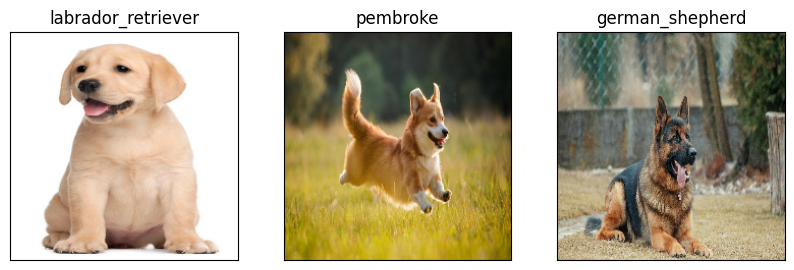

In [101]:
# check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)